In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAvgPool2D, Dense,Flatten,Dropout,BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

In [2]:
train_path='/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/'
test_path='/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/'

In [3]:
train=ImageDataGenerator( rescale=1/255.0, validation_split=0.1,).flow_from_directory(train_path, batch_size=32, target_size=(128,128), subset='training',  color_mode='rgb', class_mode='categorical', shuffle=True)

Found 63282 images belonging to 38 classes.


In [4]:
valid=ImageDataGenerator(rescale=1/255.0, validation_split=0.1,).flow_from_directory(train_path, batch_size=32, target_size=(128,128), subset='validation',  color_mode='rgb',   class_mode='categorical', shuffle=True)

Found 7013 images belonging to 38 classes.


In [5]:
test=ImageDataGenerator(rescale=1/255.0,).flow_from_directory(test_path, batch_size=32, target_size=(128,128),  color_mode='rgb',   class_mode='categorical', shuffle=True)

Found 17572 images belonging to 38 classes.


In [6]:
def show_image(data,main_title='image'):
    classes=list(data.class_indices.keys())
    plt.figure(figsize=(20,20))
    plt.suptitle(main_title, fontsize=24)
    for X_batch, y_batch in data:
        for i in range(0,16):
            plt.subplot(4,4,i+1)
            plt.imshow(X_batch[i])
            plt.title(classes[np.where(y_batch[i]==1)[0][0]])
            plt.grid(False)
        plt.show()
        break


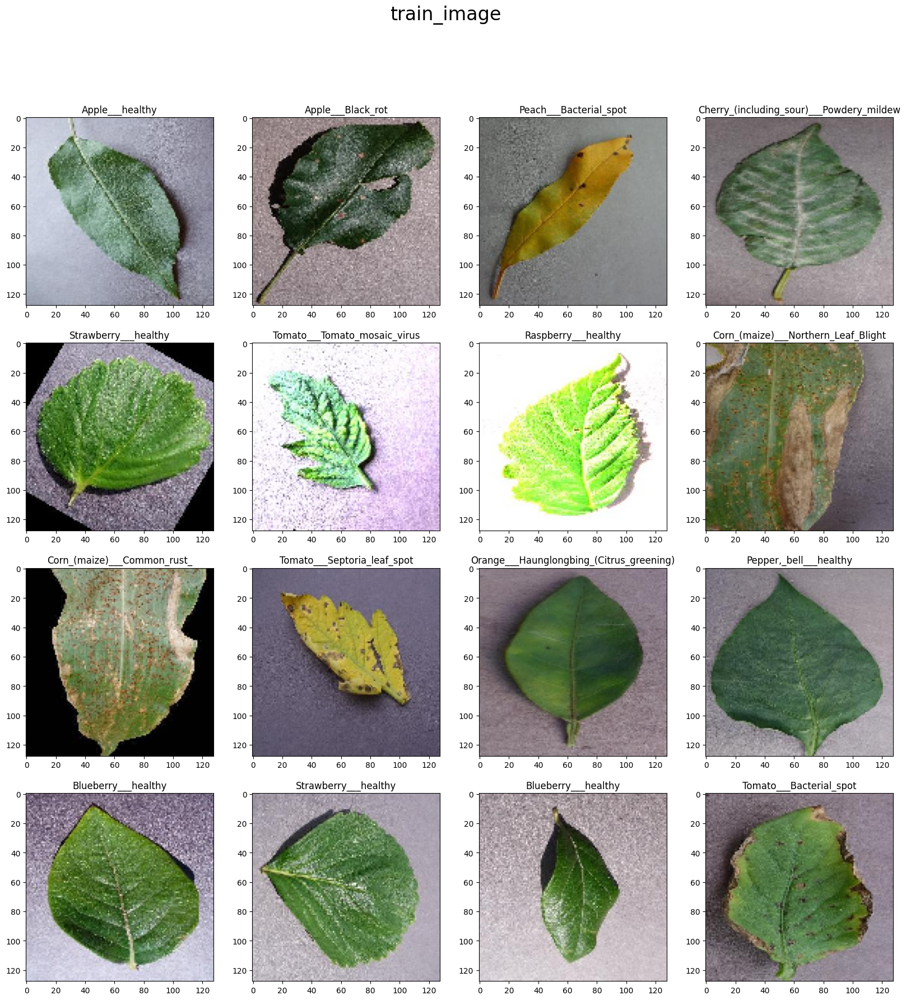

In [7]:
show_image(train,'train_image')

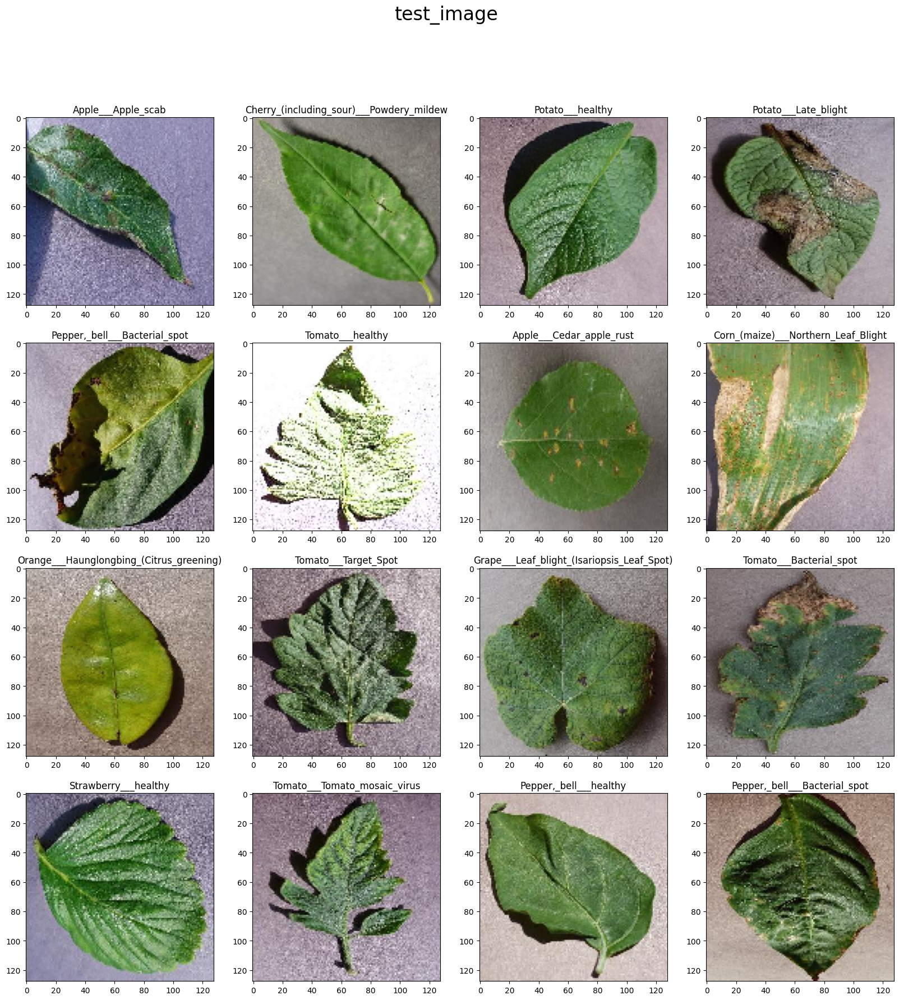

In [8]:
show_image(test,'test_image')

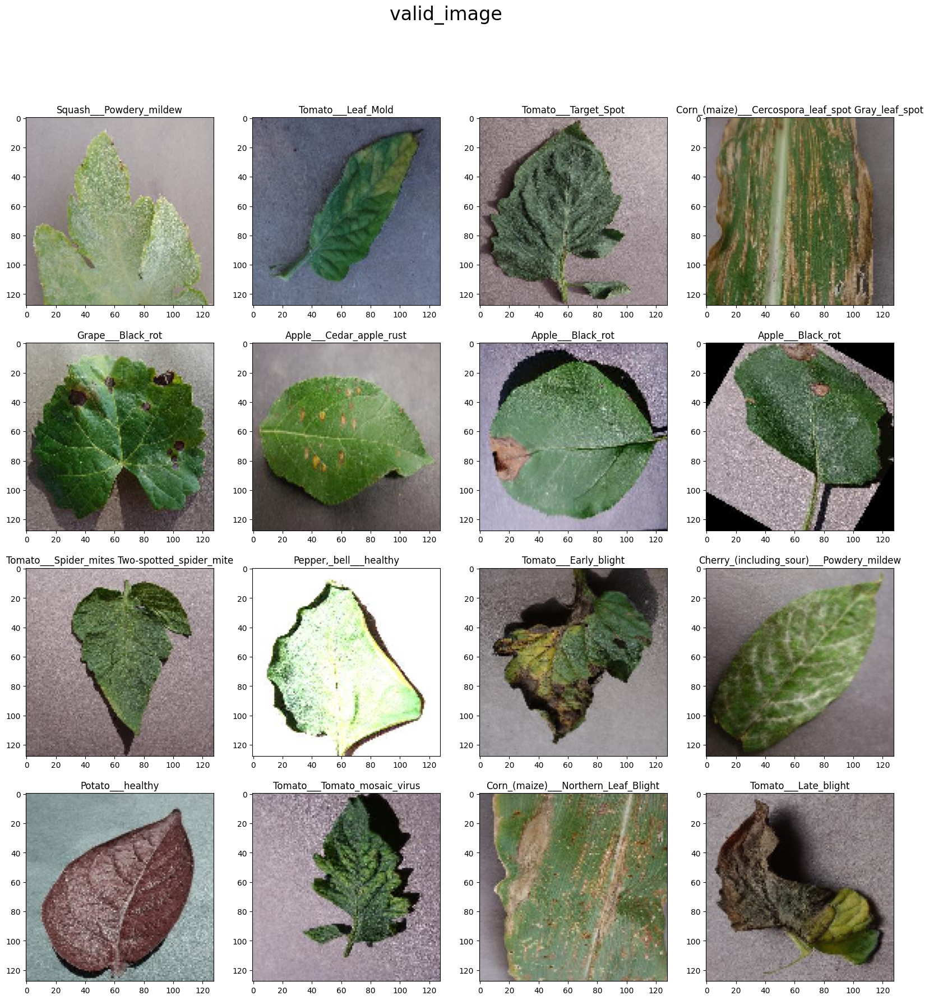

In [9]:
show_image(valid,'valid_image')

**simplae CNN**********#

In [10]:
model = Sequential()
model.add(Conv2D(32, 7, activation='relu',padding="same",name="Conv1", input_shape=(128,128,3)))
model.add(MaxPooling2D(pool_size=(2, 2),name="Pool1"))

# model.add(Conv2D(64, 5, activation='relu',padding="same",name="Conv2"))
# model.add(BatchNormalization())
# model.add(Dropout(0.5))
# model.add(MaxPooling2D(pool_size=(2, 2),name="Pool2"))

model.add(Conv2D(128, 5, activation='relu',padding="same",name="Conv3"))
model.add(MaxPooling2D(pool_size=(2, 2),name="Pool3"))

# model.add(Conv2D(256, 3, activation='relu',padding="same",name="Conv4"))
# model.add(BatchNormalization())
# model.add(Dropout(0.5))
# model.add(MaxPooling2D(pool_size=(2, 2),name="Pool4"))

model.add(Flatten(name="flatten"))
model.add(Dense(128, activation="relu", name="Dense1"))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(64, activation="relu", name="Dense2"))
model.add(Dense(38, activation="softmax", name="Output"))
optimizer = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

model.compile(loss="categorical_crossentropy", optimizer= optimizer, metrics=["accuracy",'precision','recall'])
model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Conv1 (Conv2D)                  │ (None, 128, 128, 32)   │         4,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv3 (Conv2D)                  │ (None, 64, 64, 128)    │       102,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool3 (MaxPooling2D)            │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense1 (Dense)                  │ (None, 128)            │    16,777,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense2 (Dense)                  │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 38)             │         2,470 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,895,846 (64.45 MB)

 Trainable params: 16,895,590 (64.45 MB)

 Non-trainable params: 256 (1.00 KB)

In [11]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [12]:
# Training the model
history = model.fit(train,
                    epochs= 10,
                    batch_size=32,
                    validation_data = valid,
                    callbacks = callbacks
                    )


Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1729721961.441357      92 service.cc:145] XLA service 0x7a086c00db80 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729721961.441425      92 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1729721961.441430      92 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


   1/1978 ━━━━━━━━━━━━━━━━━━━━ 5:23:17 10s/step - accuracy: 0.0312 - loss: 3.7767 - precision: 0.0000e+00 - recall: 0.0000e+00

I0000 00:00:1729721967.915946      92 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1978/1978 ━━━━━━━━━━━━━━━━━━━━ 301s 147ms/step - accuracy: 0.3653 - loss: 2.2698 - precision: 0.7143 - recall: 0.1665 - val_accuracy: 0.4924 - val_loss: 1.6962 - val_precision: 0.6120 - val_recall: 0.4082 - learning_rate: 0.0010
Epoch 2/10
1978/1978 ━━━━━━━━━━━━━━━━━━━━ 111s 56ms/step - accuracy: 0.6738 - loss: 1.0565 - precision: 0.8082 - recall: 0.5472 - val_accuracy: 0.7118 - val_loss: 0.8873 - val_precision: 0.8002 - val_recall: 0.6361 - learning_rate: 0.0010
Epoch 3/10
1978/1978 ━━━━━━━━━━━━━━━━━━━━ 113s 57ms/step - accuracy: 0.7528 - loss: 0.7817 - precision: 0.8444 - recall: 0.6706 - val_accuracy: 0.7884 - val_loss: 0.6651 - val_precision: 0.8483 - val_recall: 0.7455 - learning_rate: 0.0010
Epoch 4/10
1978/1978 ━━━━━━━━━━━━━━━━━━━━ 110s 56ms/step - accuracy: 0.7983 - loss: 0.6288 - precision: 0.8635 - recall: 0.7390 - val_accuracy: 0.8191 - val_loss: 0.5517 - val_precision: 0.8638 - val_recall: 0.7848 - learning_rate: 0.0010
Epoch 5/10
1978/1978 ━━━━━━━━━━━━━━━━━━━━ 107s 54ms/st

In [13]:
#plotting training values
import seaborn as sns
sns.set()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

precision = history.history['precision']
val_precision = history.history['val_precision']

recall =history.history['recall']
val_recall =history.history['val_recall']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

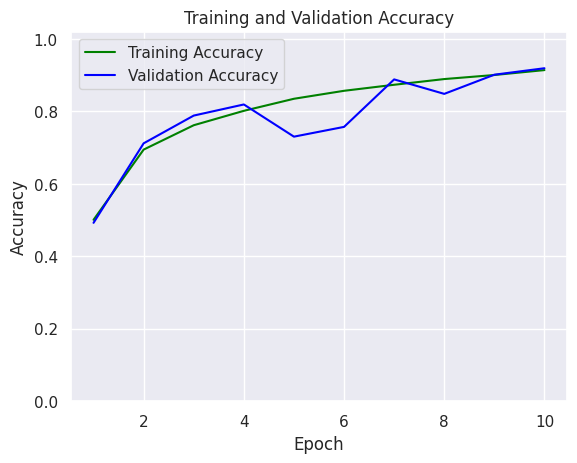

In [14]:
plt.plot(epochs, acc, color='green', label='Training Accuracy')
plt.plot(epochs, val_acc, color='blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.ylim(0,1.02)
plt.show()

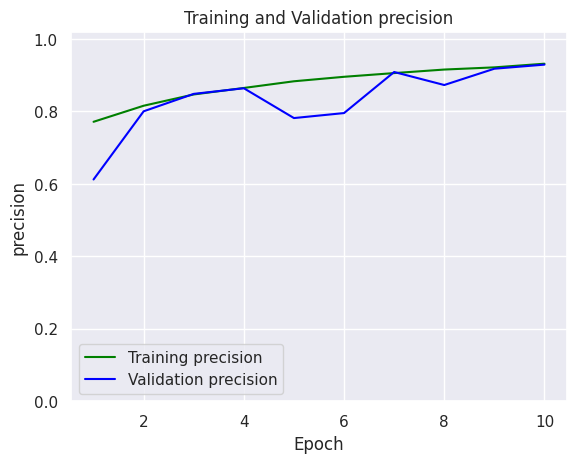

In [15]:
plt.plot(epochs, precision, color='green', label='Training precision')
plt.plot(epochs, val_precision, color='blue', label='Validation precision')
plt.title('Training and Validation precision')
plt.ylabel('precision')
plt.xlabel('Epoch')
plt.legend()
plt.ylim(0,1.02)
plt.show()

In [16]:
model.save("planet.h5")

In [17]:
import keras
model = keras.models.load_model("/kaggle/working/planet.h5")

In [18]:
results=model.evaluate(test,steps=test.samples // test.batch_size)
loss = results[0] 
accuracy = results[1]  
precision = results[2]  
recall = results[3]  

print(f'Test loss: {loss}')
print(f'Test accuracy: {accuracy}')
print(f'Test precision: {precision}')
print(f'Test recall: {recall}')

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


549/549 ━━━━━━━━━━━━━━━━━━━━ 70s 126ms/step - accuracy: 0.9228 - loss: 0.2525 - precision_1: 0.9337 - recall_1: 0.9129
Test loss: 0.2446364164352417
Test accuracy: 0.9221880435943604
Test precision: 0.9333410859107971
Test recall: 0.9133651852607727


In [19]:
# models={"ResNet152": tf.keras.applications.ResNet152,
#         "MobileNetV2": tf.keras.applications.MobileNetV2,
#         "VGG19": tf.keras.applications.VGG19}

In [20]:
# input_shape = (128,128, 3) 
# inputs = tf.keras.Input(shape=input_shape)
# print(inputs)
# model_name="ResNet152"
# base_model1=models[model_name](include_top=False,weights='imagenet',input_tensor=inputs)
# base_model1.trainable=False
# x=tf.keras.layers.GlobalAveragePooling2D()(base_model1.output)
# x=tf.keras.layers.Dense(128,activation='relu')(x)
# x=tf.keras.layers.BatchNormalization()(x)
# x=tf.keras.layers.Dropout(0.5)(x)
# x=tf.keras.layers.Dense(64,activation='relu')(x)
# x=tf.keras.layers.BatchNormalization()(x)
# x=tf.keras.layers.Dropout(0.5)(x)
# outputs=tf.keras.layers.Dense(38,activation='softmax')(x)
# model1 = tf.keras.models.Model(inputs = inputs, outputs = outputs)
# optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
# model1.compile(loss="categorical_crossentropy", optimizer= optimizer, metrics=["accuracy",'precision','recall'])

# model1.summary()


In [21]:
# early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

# model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.000001)

# callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [22]:
# history2=model1.fit(train,epochs=10,batch_size=None,validation_data=valid,callbacks=callbacks)